In [1]:
import sys
import os
import pickle

# Add the parent directory to sys.path
sys.path.append("/home/jovyan/gan-storage/amit_files")

!pip install gym

import torch
from torch.utils.data import DataLoader
from tqdm import tqdm
from torch.optim import Adam
from torch.cuda.amp import autocast, GradScaler

from keypoints.keypoints.data_augments import TpsAndRotate, nop
from keypoints.keypoints.models import keynet
from keypoints.keypoints.utils import ResultsLogger
from keypoints.keypoints.ds import datasets as ds
from keypoints.keypoints.config import config

from keypoints.keypoints.ds.datasets import split

import yaml
from PIL import Image
import argparse
from pathlib import Path
import torch
import json
import numpy as np
from tqdm import tqdm

args_path = '/home/jovyan/gan-storage/amit_files/keypoints/configs/keypoints_celeba.yaml'

torch.cuda.set_device(0)

args = config(['--config', args_path,'--data_root','/home/jovyan/gan-storage/amit_files/'])
print(args)

run_dir = f'data/models/keypoints/{args.model_type}/run_{args.run_id}'
run_dir

display = ResultsLogger(run_dir=run_dir,
                            num_keypoints=args.model_keypoints,
                            title = 'Results',
                            visuals = args.display,
                            image_capture_freq = args.display_freq,
                            kp_rows = args.display_kp_rows,
                            comment = args.comment)
display.header(args)

""" dataset """
datapack = ds.datasets[args.dataset]
train, test = datapack.make(args.dataset_train_len, args.dataset_test_len, data_root=args.data_root)
pin_memory = False if args.device == 'cpu' else True
train_l = DataLoader(train, batch_size=args.batch_size, shuffle=True, drop_last=True, pin_memory=pin_memory)
test_l = DataLoader(test, batch_size=args.batch_size, shuffle=False, drop_last=True, pin_memory=pin_memory)

print(len(train),len(test))

""" model """
kp_network = keynet.make(args).to(args.device)

kp_network

optim = Adam(kp_network.parameters(), lr=1e-4)

""" data augmentation """
if args.data_aug_type == 'tps_and_rotate':
    augment = TpsAndRotate(args.data_aug_tps_cntl_pts, args.data_aug_tps_variance, args.data_aug_max_rotate)
else:
    augment = nop

import matplotlib.pyplot as plt
scaler = GradScaler()
threshold = 0.5

# loss function
def l2_reconstruction_loss(x, x_, loss_mask=None):
    loss = (x - x_) ** 2
    if loss_mask is not None:
        loss = loss * loss_mask
    return torch.mean(loss)

criterion = l2_reconstruction_loss

def to_device(data, device):
    return tuple([x.to(device) for x in data])


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 721.7/721.7 kB 5.0 MB/s eta 0:00:0000:01
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Obtaining dependency information for gym_notices>=0.0.4 from https://files.pythonhosted.org/packages/25/26/d786c6bec30fe6110fd3d22c9a273a2a0e56c0b73b93e25ea1af5a53243b/gym_notices-0.0.8-py3-none-any.whl.metadata
  Created wheel for gym: filename=gym-0.26.2-py3-none-any.whl size=827730 sha256=2b31f6fc206a6cfdd34d3eea3a1023c62fe8b3de884eebd75feb5ac503157cf5
  Stored in directory: /home/jovyan/.cache/pip/wheels/1c/77/9e/9af5470201a0b0543937933ee99ba884cd237d2faefe8f4d37
Successfully built gym


2025-04-17 20:15:06.129570: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-04-17 20:15:06.182912: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-04-17 20:15:08.189654: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


Namespace(device=device(type='cuda', index=0), run_id=16, comment=None, demo=False, load=None, transfer_load=None, checkpoint_freq=1000, data_root='/home/jovyan/gan-storage/amit_files/', config='/home/jovyan/gan-storage/amit_files/keypoints/configs/keypoints_celeba.yaml', epochs=24, processes=7, seed=None, cma_algo=None, cma_step_mode='auto', cma_step_decay=0.001, cma_initial_step_size=None, cma_samples=None, cma_oversample=0, display=False, display_freq=5000, display_kp_rows=4, opt_level='O2', model_type='F', model_in_channels=3, model_keypoints=10, transporter_combine_mode='max', policy_action_select_mode='argmax', policy_depth=1, gym_reward_count_limit=None, optimizer='Adam', batch_size=16, lr=None, dataset='celeba', dataset_train_len=1, dataset_test_len=199, dataset_randomize=False, data_aug_tps_cntl_pts=4, data_aug_tps_variance=0.05, data_aug_max_rotate=0.1, model_z_channels=64, data_aug_type='tps_and_rotate', **{'cma_algo;': 'fast'})
device: cuda:0 run_id: 16 comment: None demo: 

In [2]:
kp_network.decoder.core.load_state_dict(torch.load('/home/jovyan/gan-storage/amit_files/Master_Project_Kgp/data/models/keypoints/F/run_16/best/decoder/core.mdl'))
kp_network.decoder.in_block.load_state_dict(torch.load('/home/jovyan/gan-storage/amit_files/Master_Project_Kgp/data/models/keypoints/F/run_16/best/decoder/in_block.mdl'))
kp_network.decoder.out_block.load_state_dict(torch.load('/home/jovyan/gan-storage/amit_files/Master_Project_Kgp/data/models/keypoints/F/run_16/best/decoder/out_block.mdl'))

kp_network.encoder.core.load_state_dict(torch.load('/home/jovyan/gan-storage/amit_files/Master_Project_Kgp/data/models/keypoints/F/run_16/best/encoder/core.mdl'))
kp_network.encoder.in_block.load_state_dict(torch.load('/home/jovyan/gan-storage/amit_files/Master_Project_Kgp/data/models/keypoints/F/run_16/best/encoder/in_block.mdl'))
kp_network.encoder.out_block.load_state_dict(torch.load('/home/jovyan/gan-storage/amit_files/Master_Project_Kgp/data/models/keypoints/F/run_16/best/encoder/out_block.mdl'))

kp_network.keypoint.core.load_state_dict(torch.load('/home/jovyan/gan-storage/amit_files/Master_Project_Kgp/data/models/keypoints/F/run_16/best/keypoint/core.mdl'))
kp_network.keypoint.in_block.load_state_dict(torch.load('/home/jovyan/gan-storage/amit_files/Master_Project_Kgp/data/models/keypoints/F/run_16/best/keypoint/in_block.mdl'))
kp_network.keypoint.out_block.load_state_dict(torch.load('/home/jovyan/gan-storage/amit_files/Master_Project_Kgp/data/models/keypoints/F/run_16/best/keypoint/out_block.mdl'))


kp_network.eval()

KeyNet(
  (encoder): Unit(
    (in_block): Sequential(
      (0): ReplicationPad2d((1, 1, 1, 1))
      (1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1))
      (2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (3): LeakyReLU(negative_slope=0.01, inplace=True)
    )
    (core): Sequential(
      (0): ReplicationPad2d((1, 1, 1, 1))
      (1): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1))
      (2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (3): LeakyReLU(negative_slope=0.01, inplace=True)
      (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (5): ReplicationPad2d((1, 1, 1, 1))
      (6): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1))
      (7): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (8): LeakyReLU(negative_slope=0.01, inplace=True)
      (9): ReplicationPad2d((1, 1, 1, 1))
      (10): Conv2d(256, 256, kern

In [3]:
import torch
import numpy as np
import cv2
from PIL import Image
import torchvision.transforms as transforms

# Assuming color_map function is defined like this:
def color_map(num_colors=20):
    # Generate a color map with 'num_colors' unique colors
    return np.random.randint(0, 255, size=(num_colors, 3))

def plot_keypoints_on_image(k, image_tensor, radius=3, thickness=2):
    # Ensure single image and keypoints are provided, not a batch
    if len(k.shape) != 2:
        raise ValueError('Expected keypoints for a single image, not a batch.')

    # Extract image dimensions
    height, width = image_tensor.size(1), image_tensor.size(2)
    num_keypoints = k.size(0)

    # Scale keypoints from normalized to pixel coordinates
    k = k.clone()  # Clone to avoid modifying the original tensor
    k[:, 0] = k[:, 0] * height  # Scale y-coordinate
    k[:, 1] = k[:, 1] * width   # Scale x-coordinate
    k.floor_()                  # Round down to the nearest integer
    k = k.detach().cpu().numpy()  # Convert to NumPy for OpenCV

    # Convert the image tensor to a PIL image, then to a NumPy array
    img = transforms.ToPILImage()(image_tensor.cpu())
    img = np.array(img)

    # Generate color map and plot each keypoint
    cm = color_map(num_keypoints)  # Create color map for each keypoint
    for co_ord, color in zip(k, cm):
        color = tuple(color.astype(int).tolist())  # Convert to tuple of int RGB values
        co_ord = co_ord.squeeze().astype(int)      # Ensure coordinates are integers
        cv2.circle(img, (co_ord[1], co_ord[0]), radius, color, thickness)

    return img


In [4]:
def plot_corresponding_images(tensor1, tensor2, tensor3, k):
    """
    Plots corresponding images from three tensors in a 16-row grid with 3 columns.
    
    Parameters:
    - tensor1 (torch.Tensor): First tensor of shape (16, 3, 16, 16).
    - tensor2 (torch.Tensor): Second tensor of shape (16, 3, 16, 16).
    - tensor3 (torch.Tensor): Third tensor of shape (16, 3, 16, 16).
    """
    # np.transpose(array, (1, 0, 2))
    tensor1 = tensor1.detach().cpu().numpy()
    tensor2 = tensor2.detach().cpu().numpy()

    images = []
    for i in range(0,k.shape[0]):
        img = plot_keypoints_on_image(k[i],tensor3[i])
        images.append(img)

    tensor3 = np.asarray(images)
    
    batch_size = tensor1.shape[0]  # Expected to be 16
    num_cols = 3  # Since we have 3 tensors
    num_rows = batch_size  # Each row will represent one set of corresponding images

    # Set up the figure and axis grid
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(num_cols * 3, num_rows * 3))
    fig.suptitle("Corresponding Images from Three Tensors", fontsize=16)

    # Loop through each batch item and plot the corresponding images
    for i in range(batch_size):
        # Tensor 1 image
        image1 = np.transpose(tensor1[i], (1, 2, 0))  # (3, 16, 16) -> (16, 16, 3)
        axes[i, 0].imshow(image1)
        axes[i, 0].axis("off")
        axes[i, 0].set_title(f"original Img {i+1}")

        # Tensor 2 image
        image2 = np.transpose(tensor2[i], (1, 2, 0))
        axes[i, 1].imshow(image2)
        axes[i, 1].axis("off")
        axes[i, 1].set_title(f"Affine Transformed - Img {i+1}")

        # Tensor 3 image
        image3 = tensor3[i]
        axes[i, 2].imshow(image3)
        axes[i, 2].axis("off")
        axes[i, 2].set_title(f"Reconstructed Img {i+1}")

    plt.tight_layout()
    plt.subplots_adjust(top=0.95)  # Adjust to make room for title
    plt.show()

In [5]:
def plot_corresponding_images4(tensor1, tensor2, tensor3,k):
    temp = tensor1
    
    # np.transpose(array, (1, 0, 2))
    tensor1 = tensor1.detach().cpu().numpy()
    tensor2 = tensor2.detach().cpu().numpy()
    
    images = []
    images2 = []
    
    for i in range(0,k.shape[0]):
        img = plot_keypoints_on_image(k[i],tensor3[i])
        img1 = plot_keypoints_on_image(k[i],temp[i])
        images.append(img)
        images2.append(img1)
    
    tensor3 = np.asarray(images)
    tensor4 = np.asarray(images2)
    
    batch_size = tensor1.shape[0]  # Expected to be 16
    num_cols = 4  # Since we have 4 tensors
    num_rows = batch_size  # Each row will represent one set of corresponding images

    # Set up the figure and axis grid
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(num_cols * 4, num_rows * 4))
    fig.suptitle("Corresponding Images from Three Tensors", fontsize=16)

    # Loop through each batch item and plot the corresponding images
    for i in range(batch_size):
        # Tensor 1 image
        image1 = np.transpose(tensor1[i], (1, 2, 0))  # (3, 16, 16) -> (16, 16, 3)
        axes[i, 0].imshow(image1)
        axes[i, 0].axis("off")
        axes[i, 0].set_title(f"original Img {i+1}")

        # Tensor 2 image
        image2 = np.transpose(tensor2[i], (1, 2, 0))
        axes[i, 1].imshow(image2)
        axes[i, 1].axis("off")
        axes[i, 1].set_title(f"Affine Transformed - Img {i+1}")

        # Tensor 3 image
        image3 = tensor3[i]
        axes[i, 2].imshow(image3)
        axes[i, 2].axis("off")
        axes[i, 2].set_title(f"Reconstructed Img on Aff Trans{i+1}")

        # Tensor 4 image
        image4 = tensor4[i]
        axes[i, 3].imshow(image4)
        axes[i, 3].axis("off")
        axes[i, 3].set_title(f"Reconstructed Img on org Img{i+1}")

    plt.tight_layout()
    plt.subplots_adjust(top=0.95)  # Adjust to make room for title
    plt.show()

In [6]:
import matplotlib.pyplot as plt
import torch

def plot_tensor_images(tensor):
    # Ensure the tensor has the expected shape
    assert tensor.shape[1] == 3, "Expected 3 channels for RGB images"
    tensor = tensor.detach().cpu().numpy()

    # Convert tensor to numpy
    images = np.transpose(tensor, (0, 2, 3, 1))  # Shape (16, 16, 16, 3)

    # Plot the images in a 4x4 grid
    fig, axes = plt.subplots(4, 4, figsize=(8, 8))
    for i, ax in enumerate(axes.flat):
        img = images[i]
        ax.imshow(img)
        ax.axis('off')
    plt.show()

In [7]:
import torch
import numpy as np
import cv2
from torchvision.utils import make_grid

# PSNR Calculation Function
def compute_psnr(img1, img2):
    """Computes PSNR between two images (NumPy format)."""
    mse = np.mean((img1 - img2) ** 2)
    if mse == 0:
        return float('inf')  # Perfect match
    max_pixel = 1.0  # Assuming images are normalized in [0,1]
    psnr_value = 20 * np.log10(max_pixel / np.sqrt(mse))
    return psnr_value


In [23]:

# Testing DataLoader (Assuming you have already created test_loader)
total_psnr = 0
num_images = 0

# Validation
for epoch in tqdm(range(0, 1)):
    with torch.no_grad():
        batch = tqdm(test_l, total=len(test) // args.batch_size)
        for i, data in enumerate(batch):
            data = to_device(data, device=args.device)
            x, x_, loss_mask = augment(*data)

            with autocast():
                x_t, z, k, m, p, heatmap = kp_network(data[0], x_)
                # plot_corresponding_images(x, x_, x_t,k)
                images_np = x_.cpu().numpy().transpose(0, 2, 3, 1)  # (B, H, W, C)
                reconstructed_np = x_t.cpu().numpy().transpose(0, 2, 3, 1)
                reconstructed_np = np.clip(reconstructed_np, 0, 1)
                images_np = np.clip(images_np, 0, 1)

                for i in range(images_np.shape[0]):
                    psnr_value = compute_psnr(images_np[i], reconstructed_np[i])
                    total_psnr += psnr_value
                    num_images += 1
    break
            

# Compute Average PSNR
average_psnr = total_psnr / num_images
print(f"Average PSNR on test dataset: {average_psnr:.2f} dB")


  0%|                                                                                   | 0/1 [00:15<?, ?it/s]

Average PSNR on test dataset: 22.09 dB


In [22]:
import torch
import numpy as np
from skimage.metrics import structural_similarity as ssim

# Function to compute SSIM
def compute_ssim(img1, img2):
    """Computes SSIM between two images (NumPy format)."""
    return ssim(img1, img2, data_range=1.0, channel_axis=-1)  # Ensure range is [0,1]

# Initialize SSIM calculation
total_ssim = 0
num_images = 0

# Validation
for epoch in tqdm(range(0, 1)):
    with torch.no_grad():
        batch = tqdm(test_l, total=len(test) // args.batch_size)
        for i, data in enumerate(batch):
            data = to_device(data, device=args.device)
            x, x_, loss_mask = augment(*data)

            with autocast():
                x_t, z, k, m, p, heatmap = kp_network(data[0], x_)
                # plot_corresponding_images(x, x_, x_t,k)
                images_np = x_.cpu().numpy().transpose(0, 2, 3, 1)  # (B, H, W, C)
                reconstructed_np = x_t.cpu().numpy().transpose(0, 2, 3, 1)
                reconstructed_np = np.clip(reconstructed_np, 0, 1)
                images_np = np.clip(images_np, 0, 1)

                for i in range(images_np.shape[0]):
                    ssim_value = compute_ssim(images_np[i], reconstructed_np[i])
                    total_ssim += ssim_value
                    num_images += 1
    break


# Compute Average SSIM
average_ssim = total_ssim / num_images
print(f"Average SSIM on test dataset: {average_ssim:.4f}")

  0%|                                                                                   | 0/1 [00:16<?, ?it/s]

Average SSIM on test dataset: 0.7413


## Interpreting SSIM Values:
## SSIM ≈ 1.0 → Perfect match (identical images).
## SSIM 0.9+ → Very high similarity, minimal distortion.
## SSIM 0.8–0.9 → Good reconstruction, slight loss of details.
## SSIM 0.6–0.8 → Noticeable quality drop, loss of structural details.
## SSIM < 0.6 → Poor reconstruction, significant loss of structure and contrast.

In [14]:
import numpy as np

# Assuming x_list and x_dash_list contain multiple batches of shape (16, 3, 128, 128)
x_list = []  # List of x batches
x_dash_list = []  # List of x_ batches

# Save as pairs
# np.savez_compressed("image_batches.npz", x_list=x_list, x_dash_list=x_dash_list)

In [15]:
# Validation
for epoch in tqdm(range(0, 1)):
    with torch.no_grad():
        batch = tqdm(test_l, total=len(test) // args.batch_size)
        for i, data in enumerate(batch):
            data = to_device(data, device=args.device)
            x, x_, loss_mask = augment(*data)
            # x_list.append(data[0])
            # x_dash_list.append(x_)
            
            with autocast():
            x_t, z, k, m, p, heatmap = kp_network(x, x_)
            plot_corresponding_images4(x, x_, x_t,k)
            # print(data[0].shape)
            # break    
    # break



100%|███████████████████████████████████████████████████████████████████████████| 1/1 [00:10<00:00, 10.66s/it]


In [17]:
# # Move tensors to CPU and convert to NumPy arrays
# x_list_cpu = [x.cpu().numpy() for x in x_list]
# x_dash_list_cpu = [x_.cpu().numpy() for x_ in x_dash_list]

# # Save the datAa
# np.savez_compressed("image_batches.npz", x_list=x_list_cpu, x_dash_list=x_dash_list_cpu)

In [8]:
loaded_data = np.load("/home/jovyan/gan-storage/amit_files/image_batches.npz", allow_pickle=True)
x_list_loaded = [torch.tensor(arr) for arr in loaded_data["x_list"]]
x_dash_list_loaded = [torch.tensor(arr) for arr in loaded_data["x_dash_list"]]

In [9]:
print(x_list_loaded[0].shape)
print(x_dash_list_loaded[0].shape)

torch.Size([16, 3, 128, 128])
torch.Size([16, 3, 128, 128])


In [12]:
def plot_corresponding_images(tensor1, tensor2, tensor3, k):
    """
    Plots corresponding images from three tensors in a 16-row grid with 4 columns.
    Normalizes tensor3 to range [0,1] for proper visualization and ensures
    compatible data types for matplotlib.
    
    Parameters:
    - tensor1 (torch.Tensor): First tensor of shape (16, 3, 16, 16).
    - tensor2 (torch.Tensor): Second tensor of shape (16, 3, 16, 16).
    - tensor3 (torch.Tensor): Third tensor of shape (16, 3, 16, 16).
    """
    import numpy as np
    import matplotlib.pyplot as plt
    
    # Process tensor1
    temp = tensor1
    tensor1 = tensor1.detach().cpu().numpy()
    
    # Process tensor2
    tensor2 = tensor2.detach().cpu().numpy()
    
    # Process keypoints on original images
    images2 = []
    for i in range(0, k.shape[0]):
        img1 = plot_keypoints_on_image(k[i], temp[i])
        images2.append(img1)
    
    # Process tensor3 (model output)
    tensor3 = tensor3.detach().cpu().numpy()
    tensor4 = np.asarray(images2)
    
    batch_size = tensor1.shape[0]
    num_cols = 4
    num_rows = batch_size
    
    # Set up the figure and axis grid
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(num_cols * 4, num_rows * 4))
    fig.suptitle("Corresponding Images from Three Tensors", fontsize=16)
    
    # Handle single row case
    if batch_size == 1:
        axes = axes.reshape(1, -1)
    
    # Loop through each batch item and plot the corresponding images
    for i in range(batch_size):
        # Tensor 1 image
        image1 = np.transpose(tensor1[i], (1, 2, 0))  # (3, 16, 16) -> (16, 16, 3)
        axes[i, 0].imshow(image1)
        axes[i, 0].axis("off")
        axes[i, 0].set_title(f"1st original Img {i+1}")
        
        # Tensor 2 image
        image2 = np.transpose(tensor2[i], (1, 2, 0))
        axes[i, 1].imshow(image2)
        axes[i, 1].axis("off")
        axes[i, 1].set_title(f"2nd Original - Img {i+1}")
        
        # Tensor 3 image (model output) - NORMALIZE IT to [0,1] and ensure float32
        image3 = np.transpose(tensor3[i], (1, 2, 0))
        
        # Apply min-max normalization to [0,1] range and ensure float32 dtype
        image3_min = image3.min()
        image3_max = image3.max()
        
        # Avoid division by zero
        if image3_max - image3_min > 1e-8:
            image3_norm = (image3 - image3_min) / (image3_max - image3_min) 
        else:
            # If all values are the same, just set to zeros or mid-value
            image3_norm = np.zeros_like(image3)
        
        # Explicitly convert to float32 to avoid dtype issues
        image3_norm = image3_norm.astype(np.float32)
        
        axes[i, 2].imshow(image3_norm)
        axes[i, 2].axis("off")
        axes[i, 2].set_title(f"Reconstructed Img {i+1}")
        
        # Tensor 4 image (with keypoints)
        image4 = tensor4[i]
        axes[i, 3].imshow(image4)
        axes[i, 3].axis("off")
        axes[i, 3].set_title(f"Keypoints on Original {i+1}")
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.95)  # Adjust to make room for title
    plt.show()
    
    # return fig  # Return the figure in case you want to save it later

  0%|                                                                                  | 0/12 [00:00<?, ?it/s]

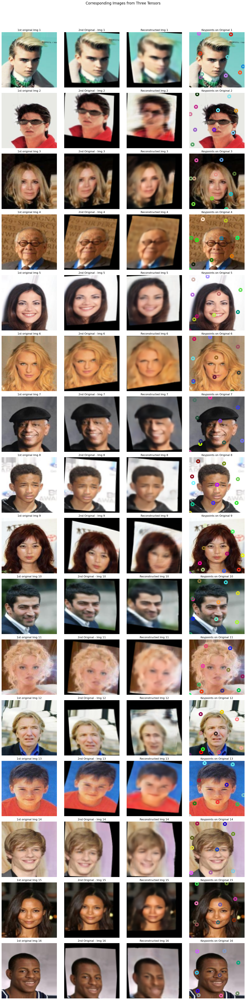

  0%|                                                                                  | 0/12 [00:13<?, ?it/s]


In [13]:
from torch.cuda.amp import autocast

# Validation
for ind in tqdm(range(0, len(x_list_loaded))):
    with autocast():  # Remove device_type argument for compatibility
        x = x_list_loaded[ind].to(device="cuda")  # Ensure correct dtype and device
        x_ = x_dash_list_loaded[ind].to(device="cuda")

        # print(x.dtype)
        # print(x_.dtype)

        x_t, z, k, m, p, heatmap = kp_network(x, x_)
        plot_corresponding_images(x, x_, x_t, k)
    break


  0%|                                                                                  | 0/12 [00:00<?, ?it/s]

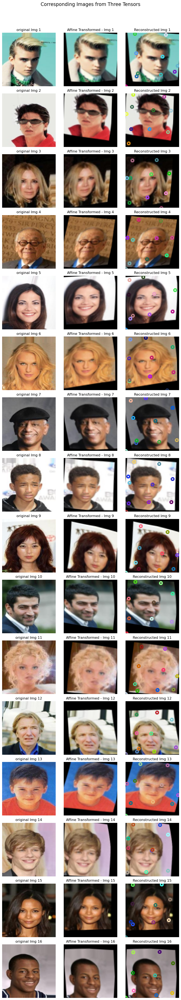

  0%|                                                                                  | 0/12 [00:06<?, ?it/s]


In [11]:
from torch.cuda.amp import autocast

# Validation
for ind in tqdm(range(0, len(x_list_loaded))):
    with autocast():  # Remove device_type argument for compatibility
        x = x_list_loaded[ind].to(device="cuda")  # Ensure correct dtype and device
        x_ = x_dash_list_loaded[ind].to(device="cuda")


        x_t, z, k, m, p, heatmap = kp_network(x, x_)
        plot_corresponding_images(x, x_, x_, k)
    break


In [11]:
import json

json_path = "/home/jovyan/gan-storage/amit_files/Master_Project_Kgp/data/models/keypoints/F/run_16/losses.json"

In [12]:
# Replace 'file.json' with the path to your JSON file
with open(json_path, 'r') as file:
    losses = json.load(file)  # Load the JSON data into a dictionary


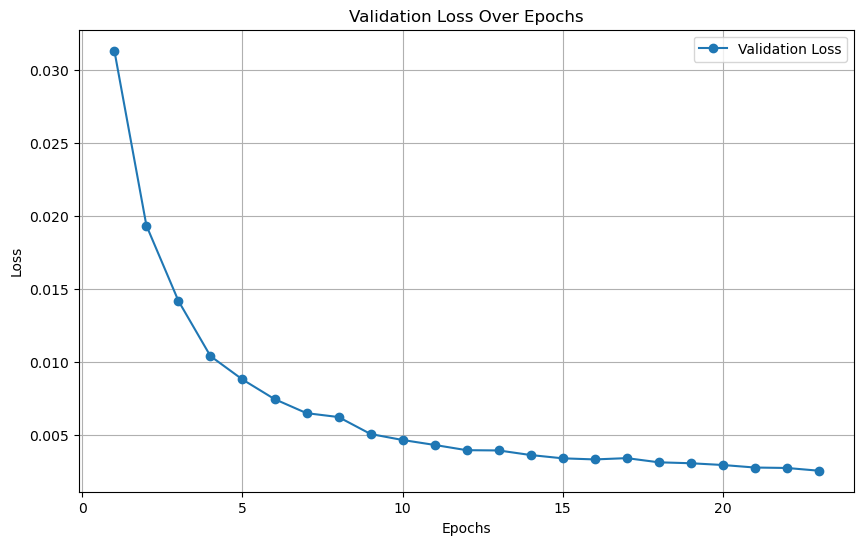

In [14]:
# Step 2: Extract train and validation losses
train_losses = losses['train_losses']
val_losses = losses['val_losses']

# Step 3: Generate a list of epoch numbers based on the length of train_losses
epochs = list(range(1, len(train_losses) + 1))

# Step 4: Plot the data
plt.figure(figsize=(10, 6))
# plt.plot(epochs, train_losses, label='Training Loss', marker='o')
plt.plot(epochs, val_losses, label='Validation Loss', marker='o')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Validation Loss Over Epochs')
plt.legend()
plt.grid(True)
plt.show()


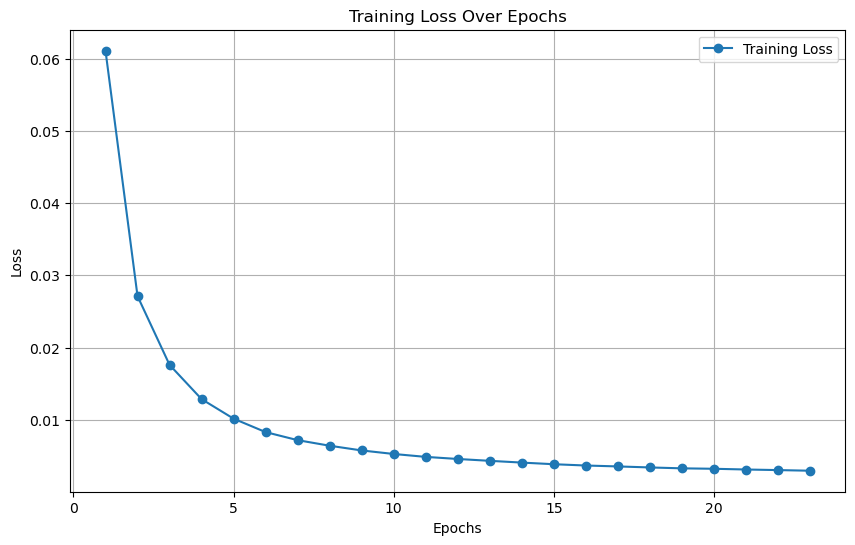

In [15]:
# Step 2: Extract train and validation losses
train_losses = losses['train_losses']
val_losses = losses['val_losses']

# Step 3: Generate a list of epoch numbers based on the length of train_losses
epochs = list(range(1, len(train_losses) + 1))

# Step 4: Plot the data
plt.figure(figsize=(10, 6))
plt.plot(epochs, train_losses, label='Training Loss', marker='o')
# plt.plot(epochs, val_losses, label='Validation Loss', marker='o')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training Loss Over Epochs')
plt.legend()
plt.grid(True)
plt.show()


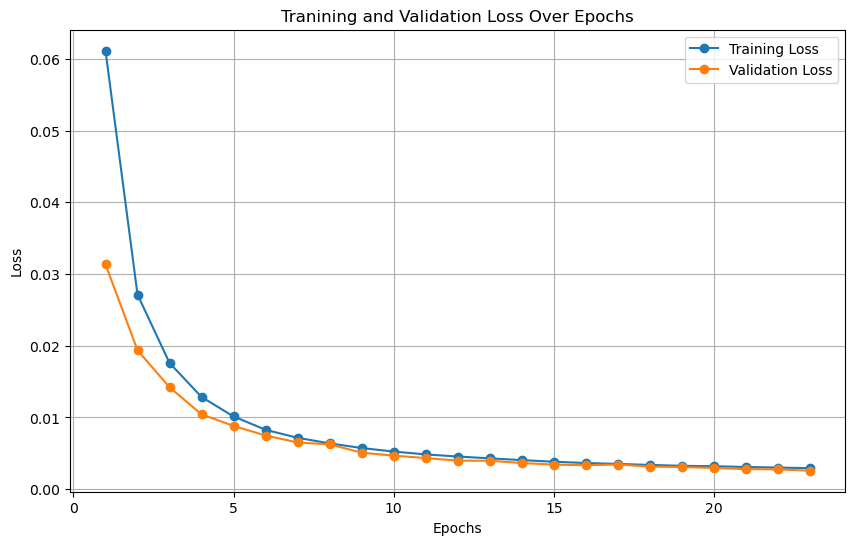

In [16]:
# Step 2: Extract train and validation losses
train_losses = losses['train_losses']
val_losses = losses['val_losses']

# Step 3: Generate a list of epoch numbers based on the length of train_losses
epochs = list(range(1, len(train_losses) + 1))

# Step 4: Plot the data
plt.figure(figsize=(10, 6))
plt.plot(epochs, train_losses, label='Training Loss', marker='o')
plt.plot(epochs, val_losses, label='Validation Loss', marker='o')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Tranining and Validation Loss Over Epochs')
plt.legend()
plt.grid(True)
plt.show()
